In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Setup

set working directory to guitarist-net and add to path

In [ ]:
%cd /content/drive/MyDrive/Research/guitarist-net

/content/drive/Othercomputers/My MacBook Pro/guitarist-net


install requirements

In [ ]:
!pip install -r requirements.txt &> /dev/null

imports

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import librosa
import librosa.display
import ui
from plot_listen.listen import play
from plot_listen.plot import plot, plot_multi_stfts
from save_load import load_weights_from_file
from save_load import save_audio
from util import torch_to_numpy, numpy_to_torch
from globals import *
from data.guitarset_loader import GuitarSetLoader
from midi_synth.midi_synth import MidiSynth

# Load Trained Model

create model

In [ ]:
synth = MidiSynth()

In [ ]:
print(synth)

MidiSynth(
  (context_network): ContextNetwork(
    (linear1): Linear(in_features=12, out_features=32, bias=True)
    (leakyReLU): LeakyReLU(negative_slope=0.01)
    (gru): GRU(32, 64, batch_first=True)
    (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
    (linear2): Linear(in_features=64, out_features=32, bias=True)
  )
  (mono_network): MonoNetworkSmall(
    (string_emb_layer): Embedding(6, 6)
    (linear1): Linear(in_features=40, out_features=128, bias=True)
    (leakyReLU1): LeakyReLU(negative_slope=0.01)
    (gru): GRU(128, 192, batch_first=True)
    (linear2): Linear(in_features=192, out_features=128, bias=True)
    (leakyReLU2): LeakyReLU(negative_slope=0.01)
    (layer_norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    (dense_amplitudes): Linear(in_features=128, out_features=102, bias=True)
    (dense_filter_coeffs): Linear(in_features=128, out_features=65, bias=True)
  )
  (harmonic_oscillator): HarmonicOscillator(
    (upsample): Upsample(sc

load weights, move to GPU, set to eval mode

In [ ]:
synth.load_state_dict(load_weights_from_file())
synth = synth.to(DEVICE)
synth.eval();

Type a number to select an option:
	0)	2023-04-20 06:28PM MIDI Synth : fine-tune-from-11700
	1)	2022-07-08 08:08PM DDSP Mono Synth : training test
	2)	2022-07-09 01:40PM DDSP Mono Synth : load model and continue training
	3)	2022-07-09 11:45PM DDSP Mono Synth : resume training (third time)
	4)	2022-07-10 10:44AM DDSP Mono Synth : train (4th time)
	5)	2022-07-19 04:05PM DDSP Mono Synth Improved : synth_improvement
	6)	2022-07-19 06:56PM DDSP Mono Synth : train with loudness centered and 32 osc + 32 filter coeffs
	7)	2022-07-20 10:48AM DDSP Mono Synth : train low E
	8)	2022-07-20 12:24PM DDSP Mono Synth Improved : improve 32 param synth - e string
	9)	2022-07-20 07:03PM DDSP Mono Synth : train with lr scheduler
	10)	2022-07-22 11:34AM DDSP Mono Synth : train low E for a while
	11)	2022-07-25 06:42PM DDSP Mono Synth : train with Leaky ReLU
	12)	2022-07-26 04:41PM DDSP Mono Synth : try training with test dataset (one guitarist)
	13)	2022-07-27 06:09PM DDSP Mono Synth : folder deleting, har

# Load Track Data

In [ ]:
loader = GuitarSetLoader()
track_id = ui.list_selection_menu(loader.guitarset.track_ids)
track_data = loader.get_audio_and_MIDI_conditioning_from_track_unchunked(track_id)

Type a number to select an option:
	0)	00_BN1-129-Eb_comp
	1)	00_BN1-129-Eb_solo
	2)	00_BN1-147-Gb_comp
	3)	00_BN1-147-Gb_solo
	4)	00_BN2-131-B_comp
	5)	00_BN2-131-B_solo
	6)	00_BN2-166-Ab_comp
	7)	00_BN2-166-Ab_solo
	8)	00_BN3-119-G_comp
	9)	00_BN3-119-G_solo
	10)	00_BN3-154-E_comp
	11)	00_BN3-154-E_solo
	12)	00_Funk1-114-Ab_comp
	13)	00_Funk1-114-Ab_solo
	14)	00_Funk1-97-C_comp
	15)	00_Funk1-97-C_solo
	16)	00_Funk2-108-Eb_comp
	17)	00_Funk2-108-Eb_solo
	18)	00_Funk2-119-G_comp
	19)	00_Funk2-119-G_solo
	20)	00_Funk3-112-C#_comp
	21)	00_Funk3-112-C#_solo
	22)	00_Funk3-98-A_comp
	23)	00_Funk3-98-A_solo
	24)	00_Jazz1-130-D_comp
	25)	00_Jazz1-130-D_solo
	26)	00_Jazz1-200-B_comp
	27)	00_Jazz1-200-B_solo
	28)	00_Jazz2-110-Bb_comp
	29)	00_Jazz2-110-Bb_solo
	30)	00_Jazz2-187-F#_comp
	31)	00_Jazz2-187-F#_solo
	32)	00_Jazz3-137-Eb_comp
	33)	00_Jazz3-137-Eb_solo
	34)	00_Jazz3-150-C_comp
	35)	00_Jazz3-150-C_solo
	36)	00_Rock1-130-A_comp
	37)	00_Rock1-130-A_solo
	38)	00_Rock1-90-C#_comp
	39)	00_Ro

# Create Input List

In [ ]:
# all models take in a list of inputs, even though the vanilla midi synth just takes in one: conditioning
inputs = []

inputs.append(torch.tensor(track_data["conditioning"], dtype=DEFAULT_TORCH_DTYPE).to(DEVICE).unsqueeze(0))

# Feed Conditioning into Synth Model

In [ ]:
output = synth(*inputs)

# Listen to output

In [ ]:
synth_audio = torch_to_numpy(output['audio'][0])
play(synth_audio)

# Compare against original

In [ ]:
orig_audio = track_data['mic_audio']
play(orig_audio)

# Save off example

In [ ]:
folder_name = "midi_synth"

model_name = input("Enter a name for the experiment/model")

save_audio(output['audio'][0], f"/content/drive/MyDrive/Research/guitarist-net-storage/demos/{folder_name}/{model_name}_{track_id}.wav")

# Plot MIDI Conditioning

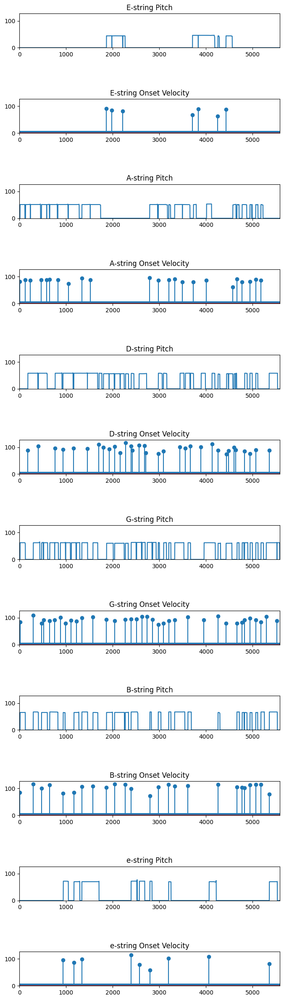

In [ ]:
from plot_listen.plot import plot_midi_conditioning

plot_midi_conditioning(track_data["conditioning"])

# Debugging checks

## Inspect all synth outputs
(factored audio and params)

In [ ]:
for key in output.keys():
    print(f"{key}:")
    print(f"{output[key].shape}:\n")

audio:
torch.Size([1, 357248]):

overall_amplitude:
torch.Size([6, 1, 5582]):

harm_distr:
torch.Size([6, 1, 101, 5582]):

H:
torch.Size([6, 1, 5582, 65]):

f0:
torch.Size([6, 1, 5582]):

string_audio:
torch.Size([6, 1, 357248]):

harmonic:
torch.Size([6, 1, 357248]):

noise:
torch.Size([6, 1, 357248]):



In [ ]:
harmonic = torch_to_numpy(output["harmonic"])
noise = torch_to_numpy(output["noise"])
string_audio = torch_to_numpy(output["string_audio"])
f0 = torch_to_numpy(output["f0"])
overall_amplitude = torch_to_numpy(output["overall_amplitude"])
audio = torch_to_numpy(output["audio"])
harm_distr = torch_to_numpy(output["harm_distr"])
H = torch_to_numpy(output["H"])

#### Output Audio

In [ ]:
play(audio)

### Resolving the weird noisy sound - focus on one string

string audio

In [ ]:
print(string_audio.shape)

(6, 1, 357248)


In [ ]:
play(string_audio[4,0])

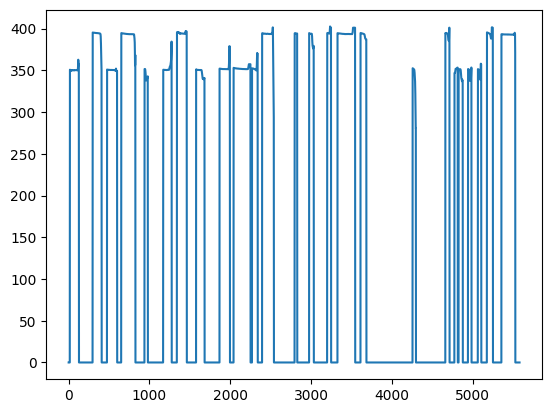

In [ ]:
plot(f0[4,0])

In [ ]:
play(harmonic[3,0])

In [ ]:
play(noise[3,0])

In [ ]:
for val in synth.harmonic_oscillator.inharm_betas:
    print(torch.sigmoid(val))

tensor(0.0002, device='cuda:0', grad_fn=<SigmoidBackward0>)
tensor(9.2793e-05, device='cuda:0', grad_fn=<SigmoidBackward0>)
tensor(7.3963e-05, device='cuda:0', grad_fn=<SigmoidBackward0>)
tensor(4.4132e-05, device='cuda:0', grad_fn=<SigmoidBackward0>)
tensor(8.8702e-05, device='cuda:0', grad_fn=<SigmoidBackward0>)
tensor(1.8490e-05, device='cuda:0', grad_fn=<SigmoidBackward0>)


Developing a lengthened string mask

In [ ]:
audio_noE = np.sum(string_audio[1:, :, :], axis=0)

In [ ]:
play(audio_noE)

In [ ]:
play(string_audio[0,0][:(1000 * HOP_LENGTH)])

In [ ]:
play(harmonic[0,0])

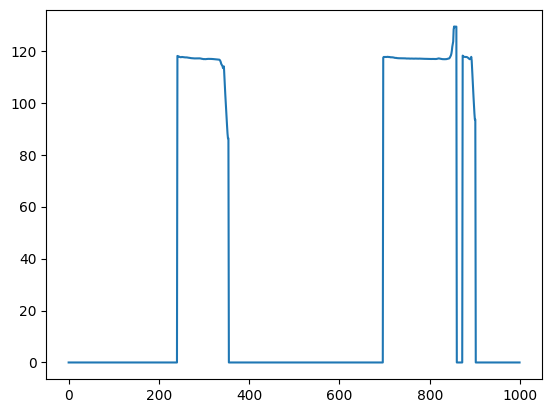

In [ ]:
plot(f0[0,0][:1000])

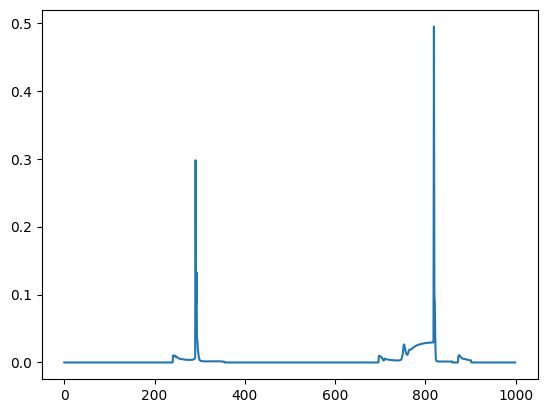

In [ ]:
plot(overall_amplitude[0,0][:1000])

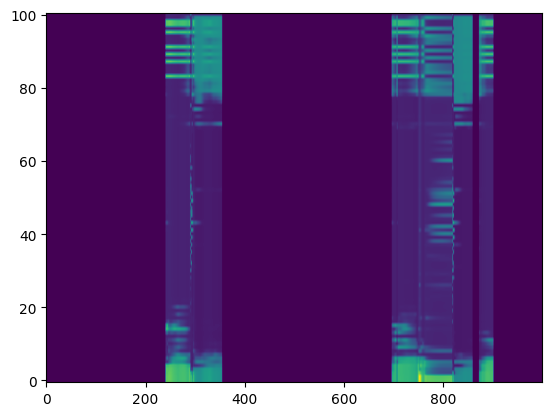

In [ ]:
plt.imshow(harm_distr[0,0, :, :1000], aspect='auto', origin="lower")

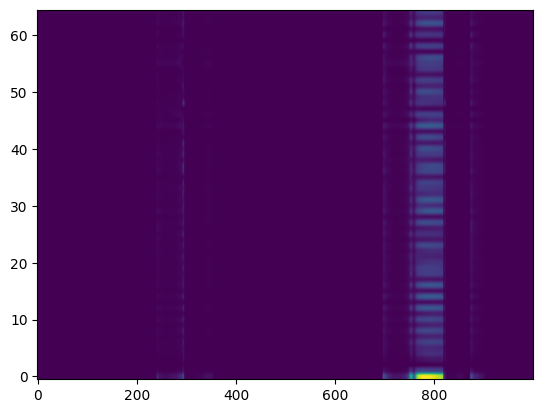

In [ ]:
plt.imshow(H[0,0, :1000, :].T, aspect='auto', origin="lower")

In [ ]:
play(noise[0,0][:(1000 * HOP_LENGTH)])

### Resolving the note attacks appearing on the wrong strings

#### A string

In [ ]:
play(string_audio[1,0])

In [ ]:
play(harmonic[1,0]) # A-string, batch item 0

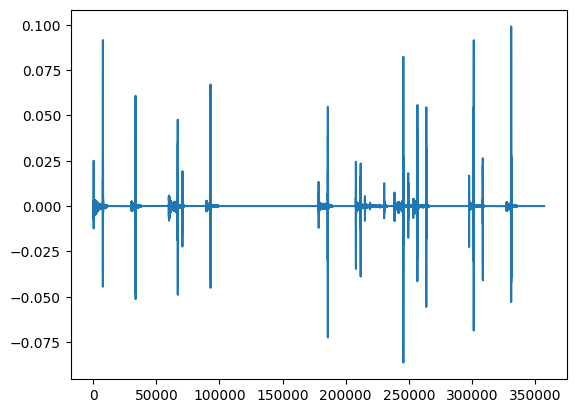

In [ ]:
plot(harmonic[1,0])

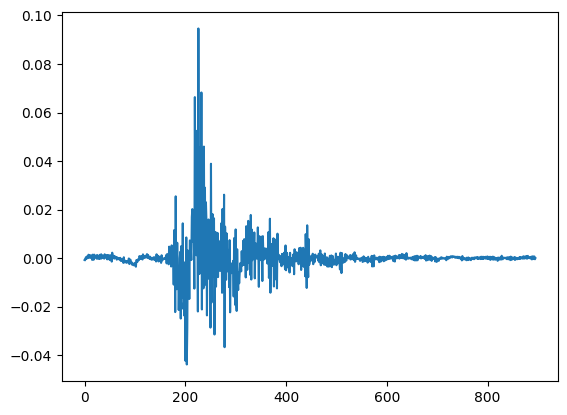

In [ ]:
plot(string_audio[1,0][(HOP_LENGTH * 116):(HOP_LENGTH * 130)])

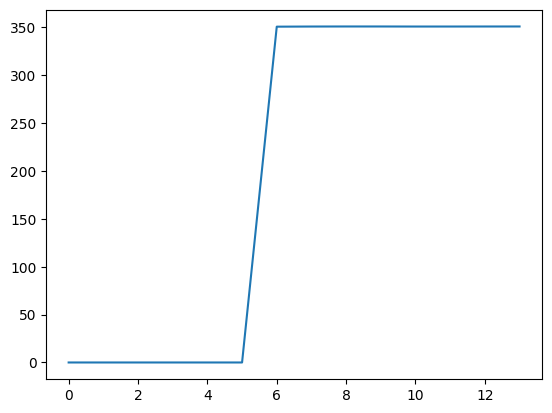

In [ ]:
plot(f0[4,0][116:130])

#### Widen string mask by 5 frames

In [ ]:
f0_batch = numpy_to_torch(f0[4])
string_mask = torch.zeros_like(f0_batch) # (batch, frames), values [0,1]
string_mask[torch.where(f0_batch > 0.0)] = 1.0 # set one for all locations where f0 is nonzero


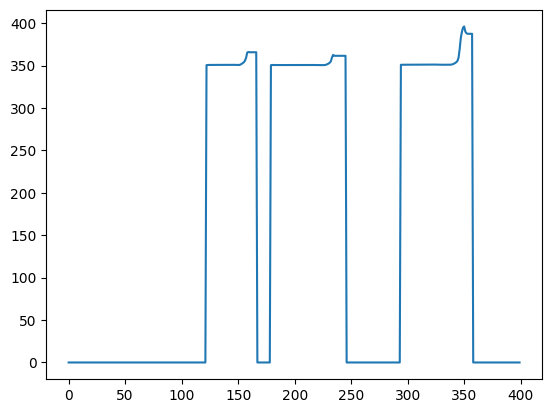

In [ ]:
plot(f0_batch[0][:400])

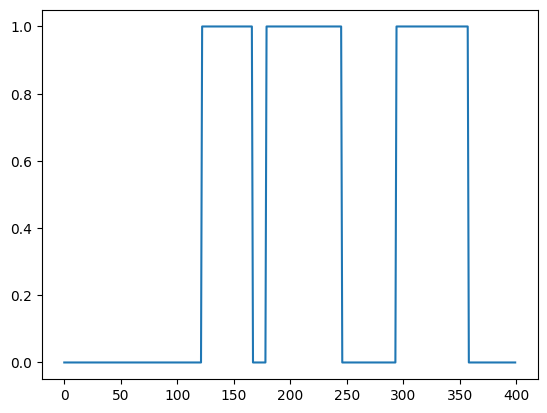

In [ ]:
plot(string_mask[0][:400])

In [ ]:
print(string_mask.shape)

torch.Size([1, 5582])


In [ ]:
left_extend = 5
right_extend = 25
import torch.nn.functional as F
string_mask_left_shift = F.pad(string_mask[:,left_extend:], (0,left_extend))
string_mask_right_shift = F.pad(string_mask[:,:(right_extend * -1)], (right_extend,0))
string_mask_sum = string_mask_left_shift + string_mask_right_shift
string_mask_extended = torch.clip(string_mask_sum, 0, 1)

print(string_mask_widened.shape)

torch.Size([1, 5582])


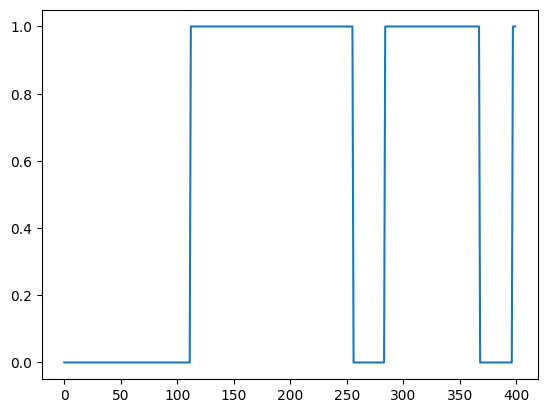

In [ ]:
plot(string_mask_widened[0][:400])

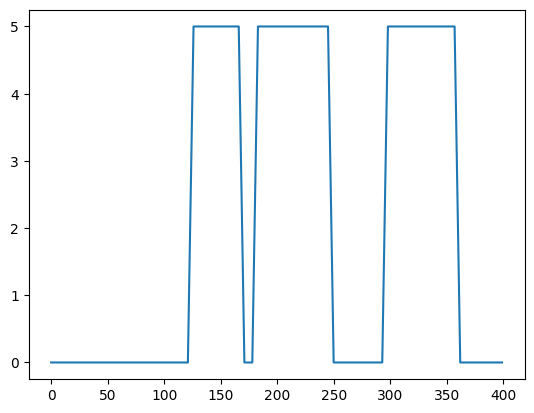

In [ ]:
plot(result[0][:400])

In [ ]:
print(f0[4].shape)

(1, 5582)


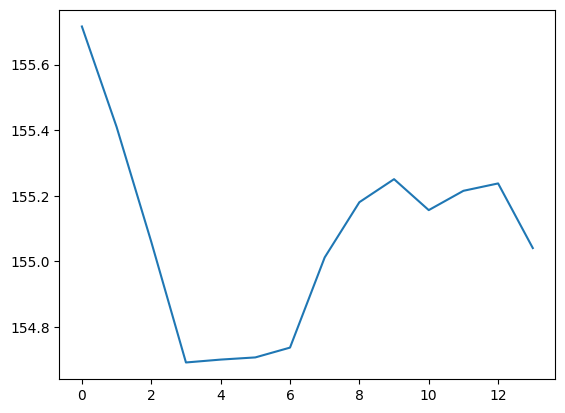

In [ ]:
plot(f0[1,0][116:130])

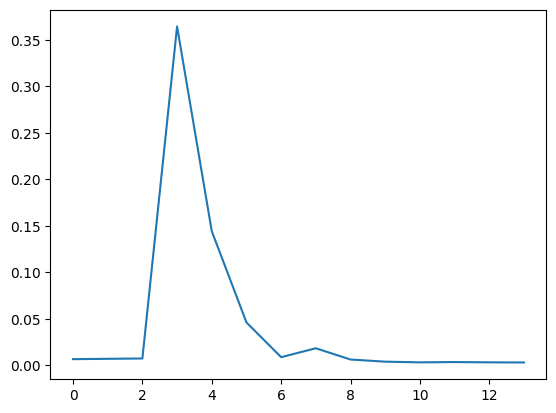

In [ ]:
plot(overall_amplitude[1, 0][116:130])

In [ ]:
play(noise[1,0])

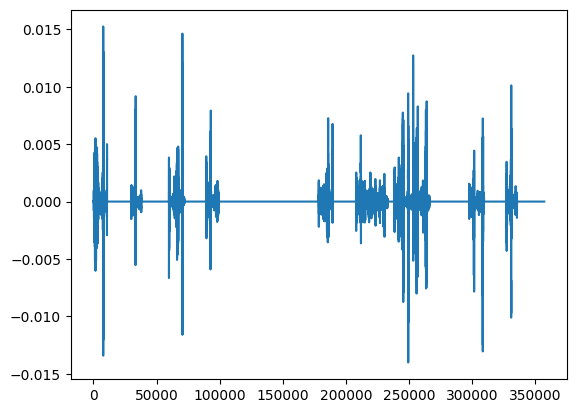

In [ ]:
plot(noise[1,0])

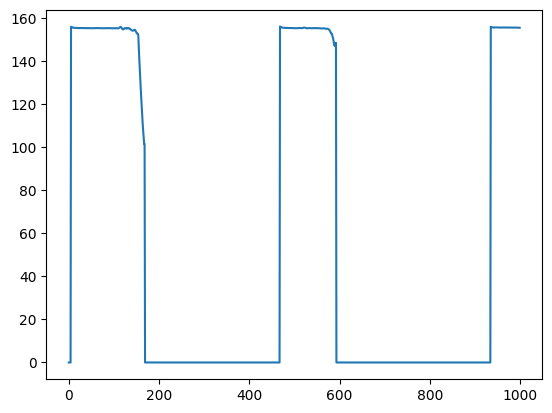

In [ ]:
plot(f0[1,0][:1000])

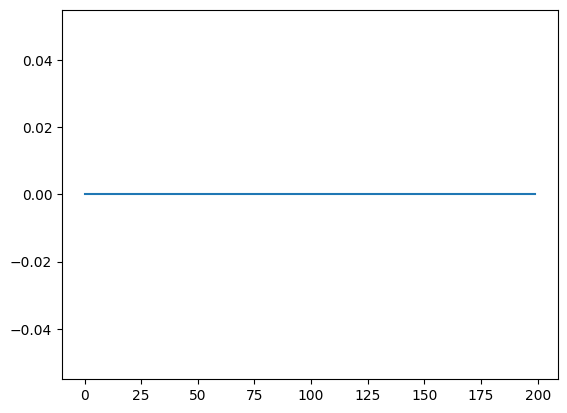

In [ ]:
plot(overall_amplitude[1,0][:1000][200:400])

In [ ]:
play(noise[1])

In [ ]:
play(string_audio[1])

In [ ]:
plot_multi_stfts(harmonic[1,0])

In [ ]:
plot_multi_stfts(noise[1,0])

## Plug in dummy conditioning

In [ ]:
# use the batch=6 to send all scales in at once
def chrom_cond_from_string(string):
    frames_per_note = 100
    cond = torch.zeros((1, 44*frames_per_note, 6, 2)) # (batch, frames, num_strings=6, pitch/vel=2)
    for i, pitch in zip(range(44),range(40,84)):
        # if i % 4 != 0:
        #     continue
        velocity = 100
        frame = frames_per_note * i
        cond[0, frame:(frame+(frames_per_note//2)), string, 0] = pitch
        cond[0, frame, string, 1] = velocity
    return cond

### e string

In [ ]:
cond_e = chrom_cond_from_string(5).to(DEVICE)
resynth_audio_e = torch_to_numpy(synth(cond_e)["audio"])
play(resynth_audio_e)

### E string

In [ ]:
cond_E = chrom_cond_from_string(0).to(DEVICE)
resynth_audio_E = torch_to_numpy(synth(cond_E)["audio"])
play(resynth_audio_E)

## Plot Reverb FIR

tensor(0.0660, device='cuda:0', grad_fn=<MulBackward0>)

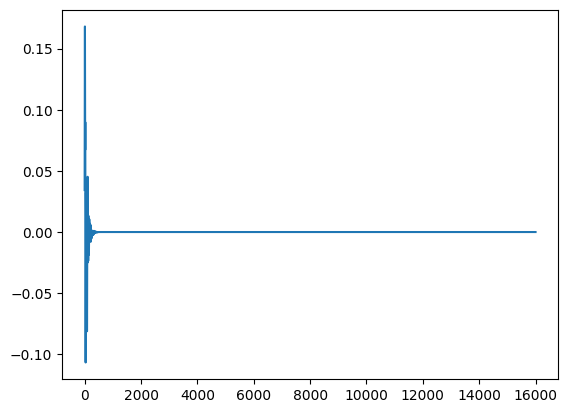

In [ ]:
fir = torch_to_numpy(synth.reverb.generate_fir()[0])
plot(fir)
synth.compute_regularization_loss()

In [ ]:
fir.shape

(1, 16000)